# Import Library & Set Globals

In [8]:
%load_ext jupyter_black

# base
import os
import sys
import warnings
import logging
import pickle

# data manipulation
import pickle
import pandas as pd
import itables
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# single cell
import scanpy as sc
import decoupler as dc
import gseapy as gp

itables.init_notebook_mode(connected=True)  # Use connected=False for offline use
warnings.simplefilter("ignore", FutureWarning)
warnings.simplefilter("ignore", UserWarning)
warnings.simplefilter("ignore", RuntimeWarning)
warnings.simplefilter("ignore", pd.errors.DtypeWarning)
warnings.simplefilter("ignore", pd.errors.PerformanceWarning)
mlogger = logging.getLogger("matplotlib")
mlogger.setLevel(logging.WARNING)

# custom
from single_cell.R import *
from single_cell.preprocess import *
from single_cell.plot import *
from single_cell.analysis import *
from spatial_seq.plot import *
from utils import *

converter = get_converter()

# R_preload()
%load_ext rpy2.ipython

The jupyter_black extension is already loaded. To reload it, use:
  %reload_ext jupyter_black


The rpy2.ipython extension is already loaded. To reload it, use:
  %reload_ext rpy2.ipython


In [9]:
%matplotlib inline
study = "paper_processed_FULL"
R_converted = False

CORES = 10
DATADIR = "../../../data"
REFDIR = "../../../references"
DOUBLETMETHODS = ["scDblFinder", "DoubletFinder", "doubletdetection", "scrublet"]

# Get all data

In [ ]:
# load
annotation = "manDoublet-seuratV3-harmony-annotated_leiden1"
savedir = os.path.join(DATADIR, "processed", study, "py", "3_annotated")
adata = sc.read_h5ad(os.path.join(savedir, f"{annotation}.h5ad"))

# order categories
order_obs(
    adata,
    "Identifier",
    [
        "GSM7747185-LFD_eWAT",
        "GSM7747187-HFD_eWAT",
        "GSM7747186-LFD_iWAT",
        "GSM7747188-HFD_iWAT",
    ],
)
order_obs(
    adata,
    "Groups",
    [
        "GSM7747185-LFD_eWAT",
        "GSM7747187-HFD_eWAT",
        "GSM7747186-LFD_iWAT",
        "GSM7747188-HFD_iWAT",
    ],
)
order_obs(adata, "Experiment", ["GSM7747185", "GSM7747186", "GSM7747187", "GSM7747188"])
order_obs(adata, "Condition", ["LFD", "HFD"])
order_obs(adata, "Sample Type", ["eWAT", "iWAT"])

In [ ]:
# # save
# annotation = "manDoublet-seuratV3-harmony-annotated_leiden1"
# savedir = os.path.join(DATADIR,'processed',study,'py', '3_annotated')
# adata.write(os.path.join(savedir,f'{annotation}.h5ad'))

# Macrophage prep

### Subset

In [ ]:
# subset
adata_macros = adata[adata.obs["cell_type"] == "Macrophage"].copy()
del adata_macros.uns, adata_macros.varm, adata_macros.obsp
sc.pp.filter_cells(adata_macros, min_genes=200)
sc.pp.filter_genes(adata_macros, min_cells=5)
Visualize(adata_macros, "_macro")

In [ ]:
# integration check
f = plt.figure(figsize=(18, 12), layout="constrained")
check_integration(
    adata_macros,
    "Groups",
    f,
    embeddings=["UMAP_macro", "LocalMAP_macro"],
    nrow=2,
    ncol=2,
)

### Clusters

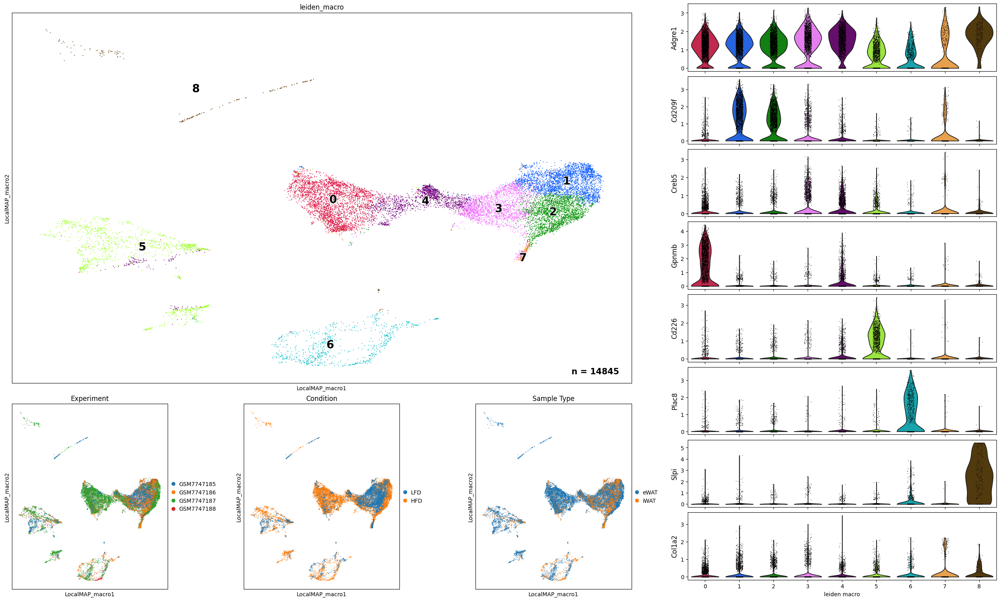

In [ ]:
cluster = False
key = "leiden_macro"
res = 0.5
res_key = f"{key}_{res:.1f}"
embedding = "LocalMAP_macro"  # "UMAP_macro"

# clsuter
if cluster is True:
    Cluster(adata_macros, "leiden_macro")

# figure prep
cluster_c = color_gen(adata_macros.obs[res_key])
f = plt.figure(figsize=(25, 15), layout="constrained")
sf = f.subfigures(1, 2, width_ratios=[2, 1])

# Large LocalMAP plot
axs = sf[0].subplots(3, 3)
gs = axs[0, 0].get_gridspec()
empty_axs(axs)

ax = sf[0].add_subplot(gs[:2, :])
sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=[res_key],
    ax=ax,
    show=False,
    legend_loc="on data",
    legend_fontoutline=2,
    legend_fontsize=20,
    palette=cluster_c.to_list(),
)
ax.annotate(
    f"n = {adata_macros.shape[0]}",
    size=15,
    fontweight="bold",
    xy=(0.98, 0.02),
    xycoords="axes fraction",
    horizontalalignment="right",
    verticalalignment="bottom",
)
ax = sf[0].add_subplot(gs[2, 0])
sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=["Groups"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_macros.obs["Groups"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 1])
sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=["Condition"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_macros.obs["Condition"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 2])
sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=["Sample Type"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_macros.obs["Sample Type"]).to_list(),
)

# Violin marker plots
markers = ["Adgre1", "Cd209f", "Creb5", "Gpnmb", "Cd226", "Plac8", "Slpi", "Col1a2"]
plot_violinplot(adata_macros, markers, res_key, sf[1])
checkDoublets(adata_macros, embedding, res_key)

In [ ]:
# cluster composition
cluster_key = "leiden_macro"
group_key = "Groups"

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(adata_macros, group_key, cluster_key, pct=False, ax=axs[0])
plot_cluster_stackedbarplot(adata_macros, group_key, cluster_key, pct=True, ax=axs[1])

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(adata_macros, cluster_key, group_key, pct=False, ax=axs[0])
plot_cluster_stackedbarplot(adata_macros, cluster_key, group_key, pct=True, ax=axs[1])

tb_count = pd.crosstab(adata_macros.obs[cluster_key], adata_macros.obs[group_key]).T
tb_count["Condition"] = ["LFD", "HFD", "LFD", "HFD"]
tb_count["Tissue"] = ["eWAT", "eWAT", "iWAT", "iWAT"]
tmp = {}
for a, df in tb_count.groupby("Condition"):
    tmp[a] = df.sum()[:-2]
pd.DataFrame(tmp).plot.bar()

tmp = {}
for a, df in tb_count.groupby("Tissue"):
    tmp[a] = df.sum()[:-2]
pd.DataFrame(tmp).plot.bar()

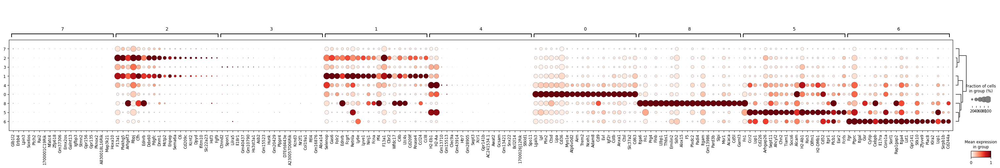

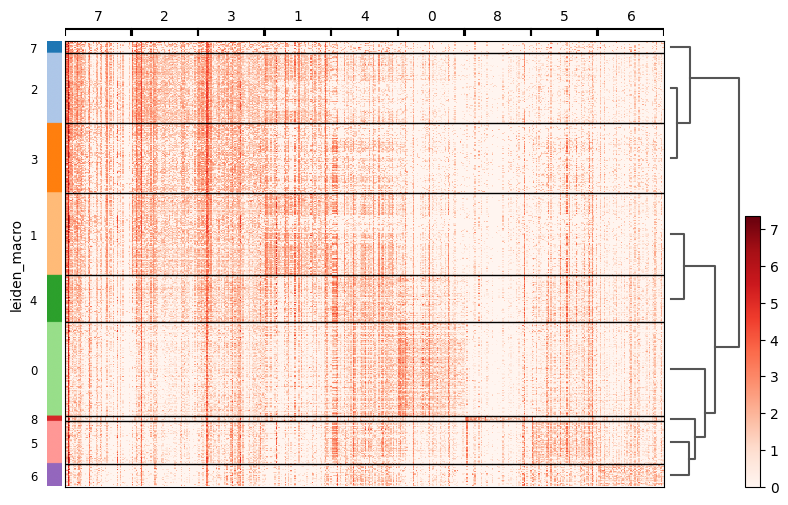

In [ ]:
# original subclusters
de_key = "de_macro_pre"
cluster_key = "leiden_macro"

clear_uns(adata_macros, cluster_key)
sc.tl.rank_genes_groups(
    adata_macros,
    groupby=cluster_key,
    key_added=de_key,
    use_raw=False,
    layer="normalized",
    method="wilcoxon",
)
f, ax = plt.subplots(1, 1, figsize=(30, 5), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_macros,
    groupby=cluster_key,
    key=de_key,
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
    ax=ax,
)
sc.pl.rank_genes_groups_heatmap(
    adata_macros, key=de_key, groupby=[cluster_key], layer="normalized", n_genes=50
)

# Cluster Regrouping

Loading ITables v2.4.4 from the internet... (need help?)


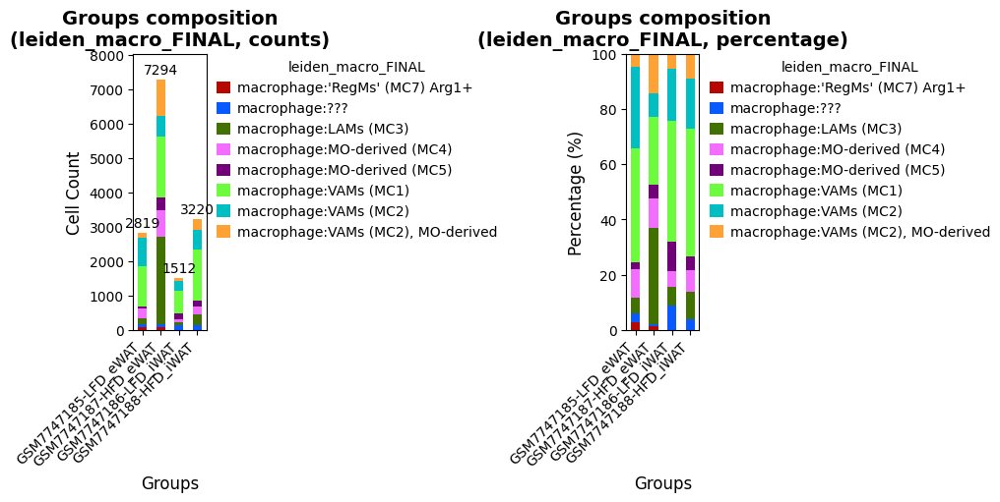

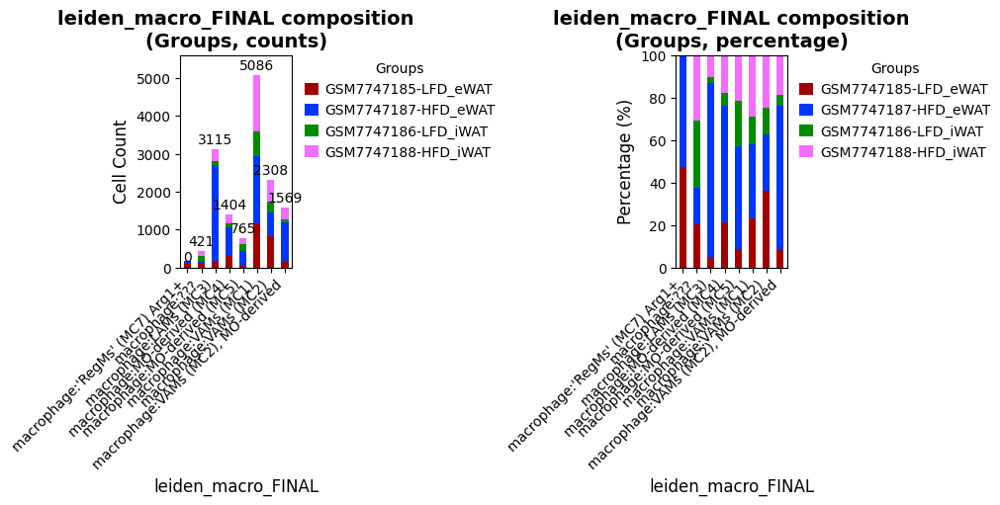

In [ ]:
# reannotate
old_cluster_key = "leiden_macro"
cluster_key = "leiden_macro_group"
group_key = "Groups"

adata_macros.obs[cluster_key] = (
    adata_macros.obs[old_cluster_key]
    .map(
        {
            "0": 1,
            "1": 2,
            "2": 3,
            "3": 4,
            "4": 5,
            "5": 6,
            "6": 7,
            "7": 8,
            "8": 9,
            "9": "remove",
            "10": "remove",
        }
    )
    .astype(str)
)

# reannotate
order_obs(
    adata_macros,
    cluster_key,
    pd.Series(np.sort(adata_macros.obs[cluster_key].unique())).astype(str),
)

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(adata_macros, group_key, cluster_key, pct=False, ax=axs[0])
plot_cluster_stackedbarplot(adata_macros, group_key, cluster_key, pct=True, ax=axs[1])

f = plt.figure(figsize=(10, 5), layout="constrained")
axs = f.subplots(1, 2)
plot_cluster_stackedbarplot(adata_macros, cluster_key, group_key, pct=False, ax=axs[0])
plot_cluster_stackedbarplot(adata_macros, cluster_key, group_key, pct=True, ax=axs[1])

pd.crosstab(adata_macros.obs[cluster_key], adata_macros.obs[group_key])

dendrogram data not found (using key=dendrogram_leiden_macro_FINAL). Running `sc.tl.dendrogram` with default parameters. For fine tuning it is recommended to run `sc.tl.dendrogram` independently.


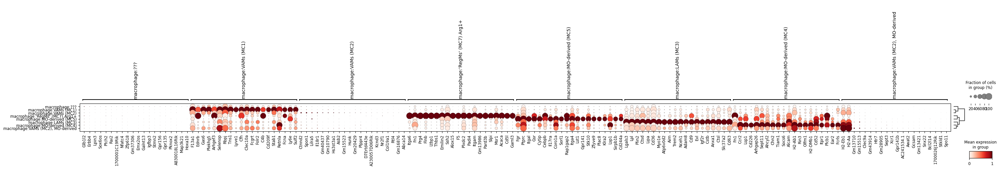

Gene labels are not shown when more than 50 genes are visualized. To show gene labels set `show_gene_labels=True`


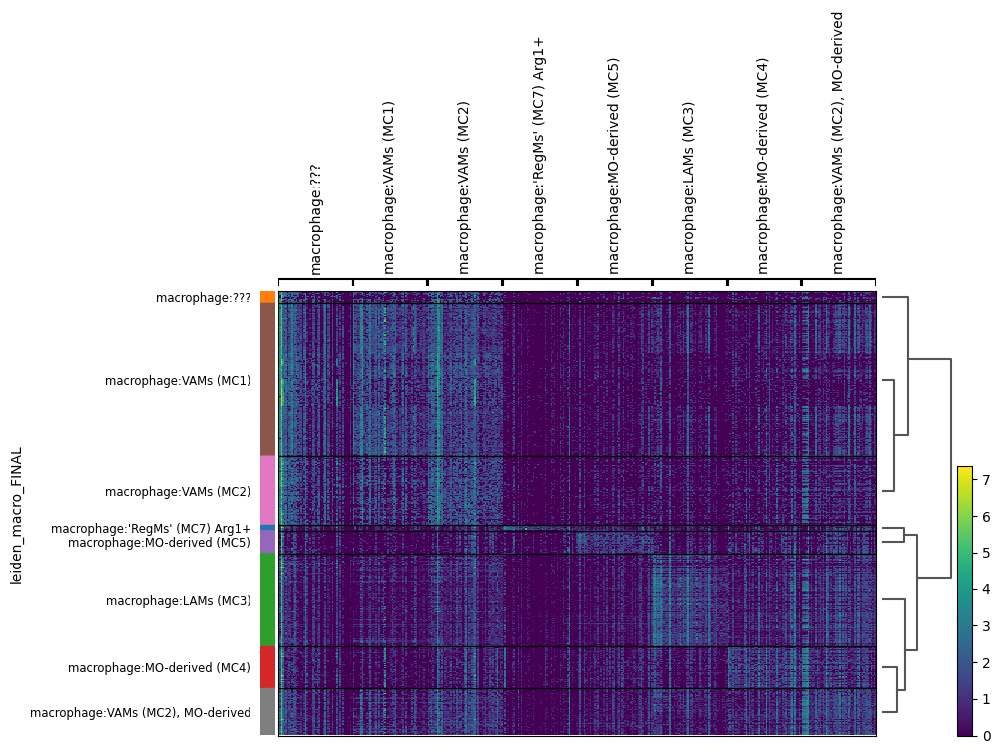

In [ ]:
group_key = "leiden_macro_group"
de_key = "de_macro"
runDEGs = True

# clean metadata
clear_uns(adata_macros, group_key)

if runDEGs is True:
    # run DEGs
    sc.tl.rank_genes_groups(
        adata_macros,
        groupby=group_key,
        key_added=de_key,
        use_raw=False,
        layer="normalized",
        method="wilcoxon",
    )

# plot DEGs dotplot
f, ax = plt.subplots(1, 1, figsize=(30, 5), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_macros,
    groupby=group_key,
    key=de_key,
    standard_scale="var",
    n_genes=20,
    min_logfoldchange=2,
    ax=ax,
)

# plot DEGs heatmap
sc.pl.rank_genes_groups_heatmap(
    adata_macros, key=de_key, groupby=group_key, layer="normalized", n_genes=50
)

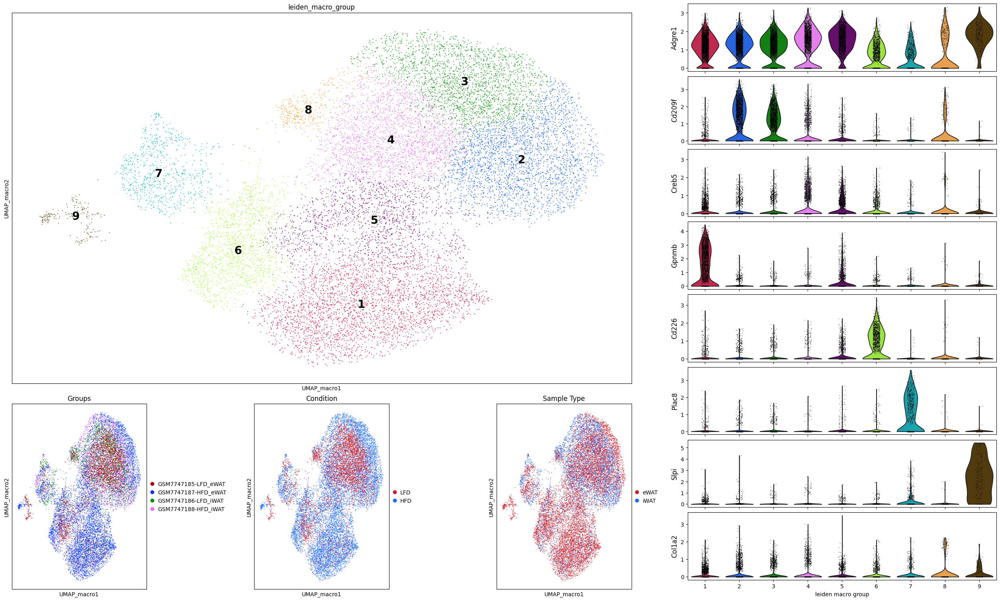

In [ ]:
key = "leiden_macro_group"
embedding = "UMAP_macro"  # "UMAP_macro"

# figure prep
cluster_c = color_gen(adata_macros.obs[key])
f = plt.figure(figsize=(25, 15), layout="constrained")
sf = f.subfigures(1, 2, width_ratios=[2, 1])

axs = sf[0].subplots(3, 3)
gs = axs[0, 0].get_gridspec()
empty_axs(axs)

# Large LocalMAP plot
ax = sf[0].add_subplot(gs[:2, :])
sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=[key],
    ax=ax,
    show=False,
    legend_loc="on data",
    legend_fontoutline=2,
    legend_fontsize=20,
    palette=cluster_c.to_list(),
)
ax = sf[0].add_subplot(gs[2, 0])
sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=["Groups"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_macros.obs["Groups"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 1])
sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=["Condition"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_macros.obs["Condition"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 2])
sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=["Sample Type"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_macros.obs["Sample Type"]).to_list(),
)

# Violin marker plots
markers = ["Adgre1", "Cd209f", "Creb5", "Gpnmb", "Cd226", "Plac8", "Slpi", "Col1a2"]
plot_violinplot(adata_macros, markers, key, sf[1])

In [ ]:
# relevant subsets
ewat_macros = adata_macros[adata_macros.obs["Sample Type"] == "eWAT"].copy()
lfd_ewat_macros = ewat_macros[ewat_macros.obs["Condition"] == "LFD"].copy()
hfd_ewat_macros = ewat_macros[ewat_macros.obs["Condition"] == "HFD"].copy()

# Dissecting clusters

In [29]:
# define markers
flow_markers = ["Lyve1", "H2-Ab1", "Mgl2", "Cx3cr1", "Mrc1"]

selected_markers = [
    "Ly6e",
    "Arg1",  # Arginase 1
    "Itgax",  # Integrin alpha X (CD11c)
    "Timd4",  # T-cell immunoglobulin and mucin domain containing 4 (TIM-4)
    "H2-Ab1",  # MHC class II (commonly H2-Ab1 for mouse)
    "Maf",  # Maf bZIP transcription factor
    "Mrc1",  # Mannose receptor C type 1 (CD206)
    "Trem2",  # Triggering receptor expressed on myeloid cells 2
    "Fn1",  # Fibronectin 1
    "Cd36",  # CD36 molecule
    "Lipa",  # Lipase A, lysosomal acid, cholesterol esterase
    "Lpl",  # Lipoprotein lipase
    "Cx3cr1",  # CX3C chemokine receptor 1
    "Siglec1",  # Also known as Cd169
    "Cd163",  # CD163 molecule
    "Retnla",  # Resistin-like alpha (RELMα)
    "Gas6",  # Growth arrest-specific 6
    "Axl",  # AXL receptor tyrosine kinase
    "Mertk",  # MERTK protein tyrosine kinase
    "Cd9",
    "Mgl2",
    "Ccr2",
    # "Tyro3",      # TYRO3 protein tyrosine kinase
]

spatial_informed_markers = [
    "Mmp12",
    "Cd9",
    "Lyz1",
    "Timd4",
    "Cd5l",
    "Arg1",
    "Il1rn",
    "Ccl9",
    "Clec4d",
    "Cx3cr1",
    "Mrc1",
    "Marco",
    "Trem2",
    "Maf1",
    "S100a4",
    "Itgax",
    "Maf",
    "H2-Ab1",
]

paper_markers = [
    "Cd209f",
    "Lyve1",
    "Mgl2",
    "Cd74",
    "Gpnmb",
    "Trem2",
    "Itpr1",
    "Cd226",
    "Ccr2",
    "Plac8",
    "Cx3cr1",
    "Slpi",
    "Alox15",
    "Col1a2",
    "Col5a2",
]

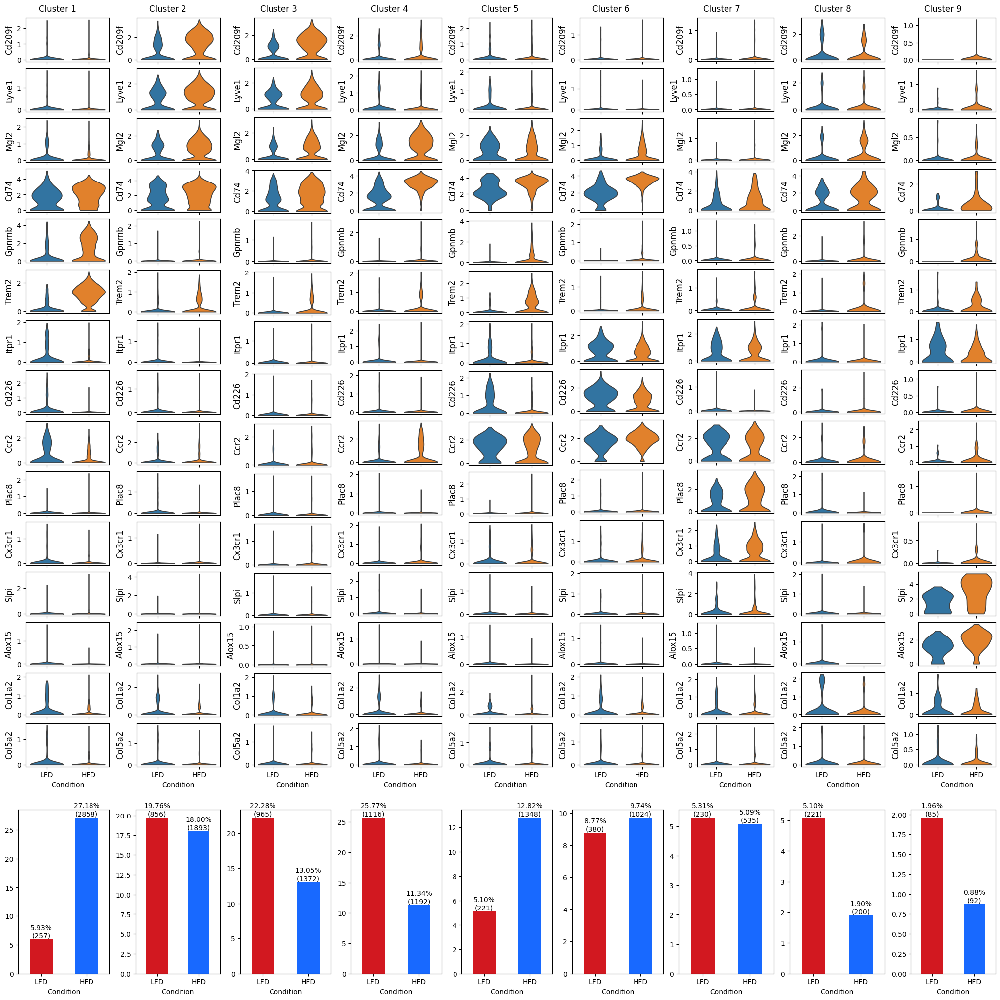

In [ ]:
f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(
    adata_macros, "Condition", "leiden_macro_FINAL", paper_markers, f
)

In [ ]:
f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(
    adata_macros, "Condition", "leiden_macro_group", selected_markers, f
)

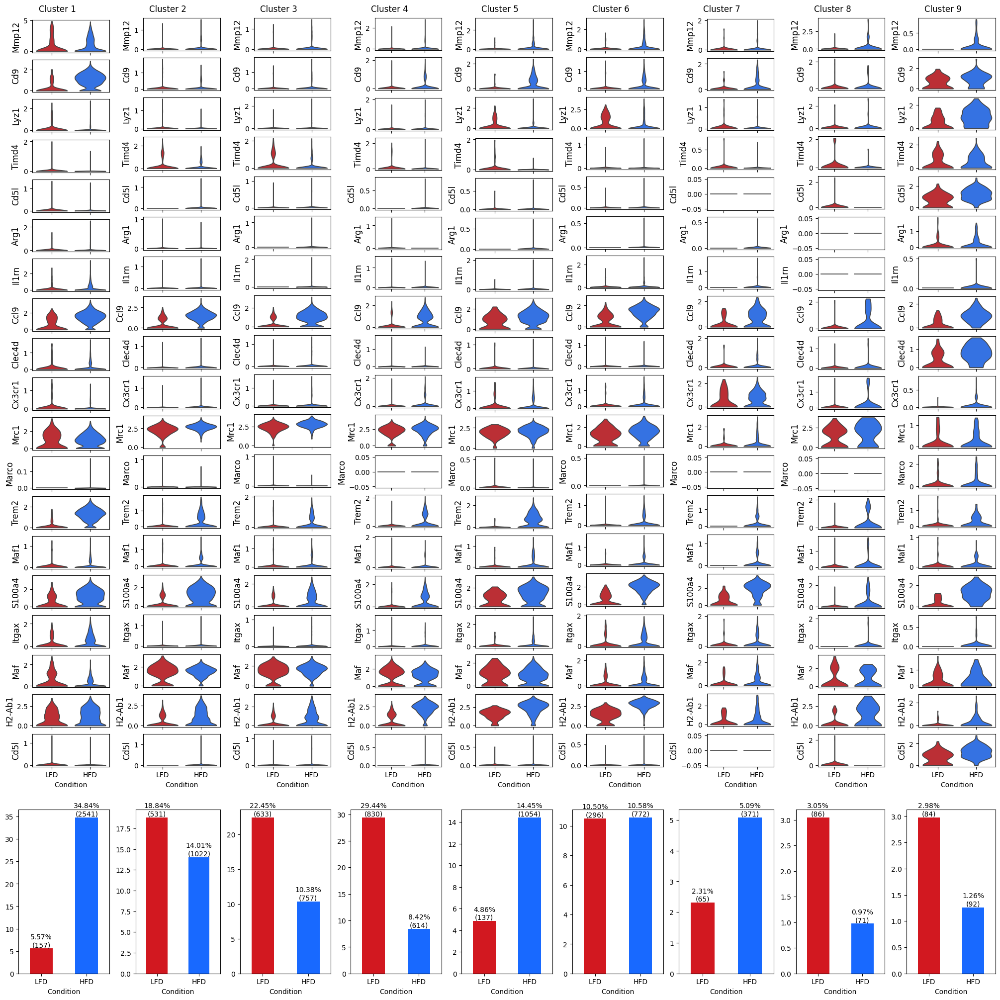

In [ ]:
# violin plots, separated by condition & cluster
f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(
    ewat_macros, "Condition", "leiden_macro_group", spatial_informed_markers, f
)

In [ ]:
# DEG markers
f = plt.figure(figsize=(50, 10), layout="constrained")
sf = f.subfigures(1, 5)
clusters = adata_macros.obs["leiden_macro_group"].cat.categories
genes = [
    group.head(10).index.tolist()
    for name, group in sc.get.rank_genes_groups_df(
        adata_macros, group=None, key="de_macro"
    ).groupby()
]

# genes = [["Pecam1", "Fabp4", "Cdh5", "Cdh13", "Ptprb", "Adgrf5", "Mgll", "Etl4", "Gpihbp1", "Mecom"],
#         ["F13a1", "Rbpj", "Mrc1", "Maf", "Slc9a3r2", "Ctss", "Gas6", "Serinc3", "Fcgr2b", "Ap2a2"],
#         ["Lgals3", "Lipa", "Ctse", "Adam8", "Atp6v0d2", "Trem2", "Psap", "Plin2", "Mfsd12", "Ms4a6c"],
#         ["Jarid2", "Klf2", "Gsr", "Ccr2", "Ifitm6", "Arhgap26", "Plcb1", "Itgal", "Itga4", "Fam49b"],
#         ["Flnb", "Prg4", "Emilin2", "Thbs1", "Fn1", "Itga6", "Ssh2", "Alox15", "Ltbp1", "Itgam"]
# ]

for g, gene in enumerate(genes):
    plot_violinplot(adata_macros, gene, "leiden_macro_group", sf[g])

### 1 vs 5

Groups are not reordered because the `groupby` categories and the `var_group_labels` are different.
categories: 1, 2, 3, etc.
var_group_labels: 1


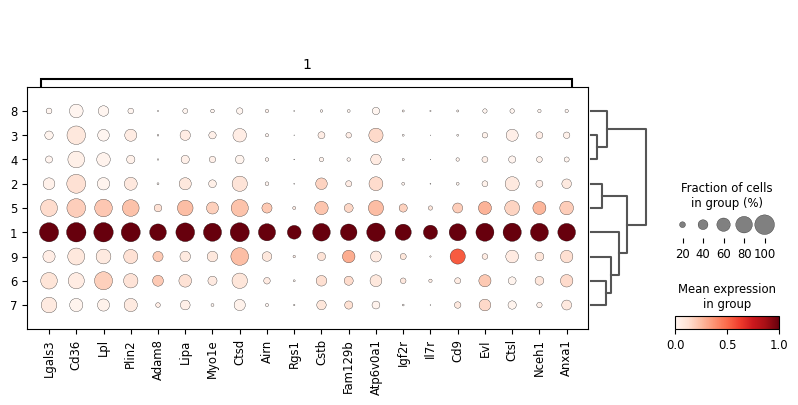

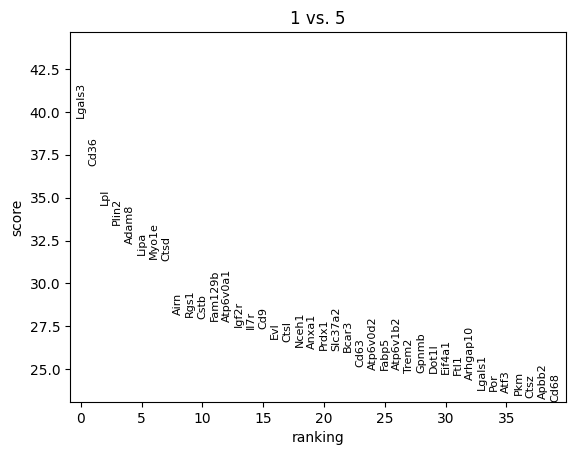

Loading ITables v2.4.4 from the internet... (need help?)


In [ ]:
de_key = "temp_cluster"
group_key = "leiden_macro_group"


sc.tl.rank_genes_groups(
    ewat_macros,
    group_key,
    groups=["1"],
    reference="5",
    method="wilcoxon",
    key_added=de_key,
    use_raw=False,
    layer="normalized",
)

sc.pl.rank_genes_groups_dotplot(
    ewat_macros,
    groups=["1"],
    key=de_key,
    standard_scale="var",
    n_genes=20,
)
sc.pl.rank_genes_groups(ewat_macros, groups=["1"], n_genes=40, key=de_key)
df = sc.get.rank_genes_groups_df(ewat_macros, group=None, key=de_key, pval_cutoff=0.05)
df

### 2,3,4,5

Groups are not reordered because the `groupby` categories and the `var_group_labels` are different.
categories: 1, 2, 3, etc.
var_group_labels: 2, 3, 4


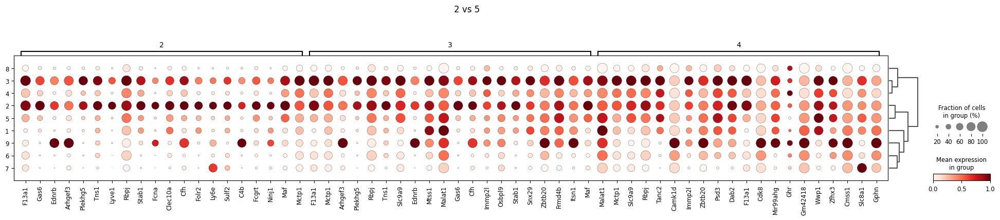

Groups are not reordered because the `groupby` categories and the `var_group_labels` are different.
categories: 1, 2, 3, etc.
var_group_labels: 2, 3


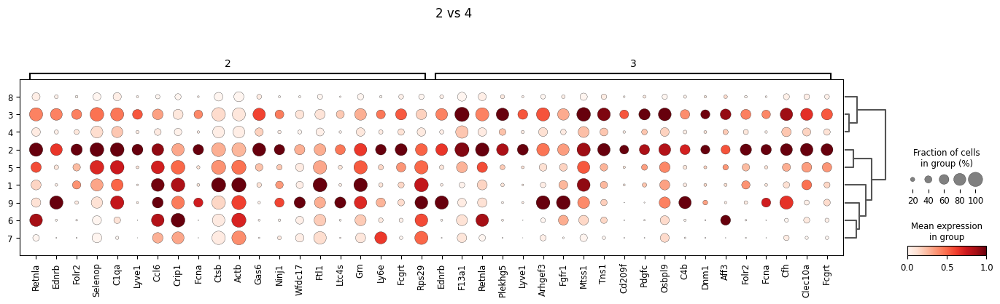

Groups are not reordered because the `groupby` categories and the `var_group_labels` are different.
categories: 1, 2, 3, etc.
var_group_labels: 2


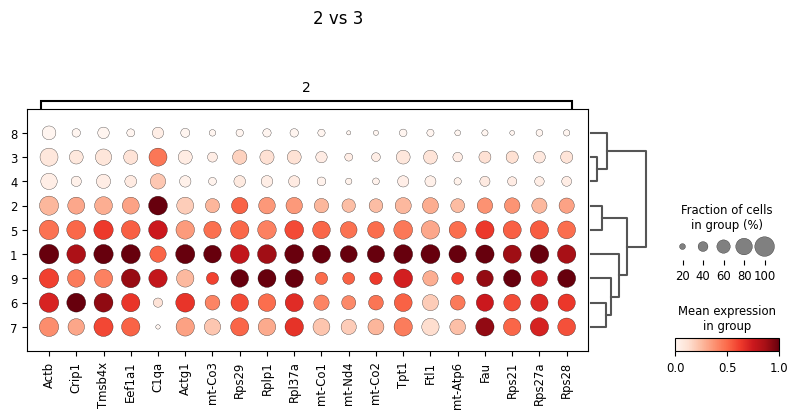

In [44]:
de_key = "de_234_5"
comp_groups = ["2", "3", "4"]
ref = "5"
sc.tl.rank_genes_groups(
    ewat_macros,
    group_key,
    groups=comp_groups,
    reference=ref,
    method="wilcoxon",
    key_added=de_key,
    use_raw=False,
    layer="normalized",
)
sc.pl.rank_genes_groups_dotplot(
    ewat_macros,
    groups=comp_groups,
    key=de_key,
    standard_scale="var",
    n_genes=20,
    title=f"{g} vs {ref}",
)

de_key = "de_23_4"
comp_groups = ["2", "3"]
ref = "4"
sc.tl.rank_genes_groups(
    ewat_macros,
    group_key,
    groups=comp_groups,
    reference=ref,
    method="wilcoxon",
    key_added=de_key,
    use_raw=False,
    layer="normalized",
)
sc.pl.rank_genes_groups_dotplot(
    ewat_macros,
    groups=comp_groups,
    key=de_key,
    standard_scale="var",
    n_genes=20,
    title=f"{g} vs {ref}",
)

de_key = "de_2_3"
comp_groups = ["2"]
ref = "3"
sc.tl.rank_genes_groups(
    ewat_macros,
    group_key,
    groups=comp_groups,
    reference=ref,
    method="wilcoxon",
    key_added=de_key,
    use_raw=False,
    layer="normalized",
)
sc.pl.rank_genes_groups_dotplot(
    ewat_macros,
    groups=comp_groups,
    key=de_key,
    standard_scale="var",
    n_genes=20,
    title=f"{g} vs {ref}",
)

### ORA Enrichment

In [ ]:
sources = ["GO:MF", "GO:CC", "KEGG", "REAC"]
runGO = True

if runGO is True:
    GOterms = GO_Enrich(
        adata_macros,
        "leiden_macro_FINAL",
        "de_macro",
        sources=sources,
        pval_cutoff=1e-5,
    )

figsizes = [(8, 12), (8, 14), (8, 8), (8, 10)]
for n, source in enumerate(sources):
    fig = plot_go_enrichment(
        df_dict=GOterms[source],
        pvalue_col="p_value",
        score_col="term_size",
        pvalue_threshold=0.05,
        rank_by="pvalue",
        top_n=30,
        use_log_pvalue=True,
        use_log_score=False,
        figsize=figsizes[n],
        database=source,
    )

    plt.show()

AssertionError: query_1 is empty

### GSEA

In [23]:
# GSEApy approach, by cluster
runGSEA = True
method = "gsea"
comparison = "leiden_macro_FINAL"
collection_query = "mh"

annotation = "manDoublet-seuratV3-harmony-annotated-macro - GSEA by cluster"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")

# get geneset info
ref_dir = os.path.join(REFDIR, "interactome")
gsea_sets = {
    "MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"),
    "MSigDB-M2-CP": os.path.join(ref_dir, "m2.cp.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M3": os.path.join(ref_dir, "m3.all.v2025.1.Mm.symbols.gmt"),
    "MSigDB-M5-GO": os.path.join(ref_dir, "m5.go.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M7": os.path.join(ref_dir, "m7.all.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M8": os.path.join(ref_dir, "m8.all.v2025.1.Mm.symbols.gmt"),
}

if runGSEA is True:
    cell_gsea_results = GSEA_gseapy(
        adata_macros,
        genesets=[dataset for dataset in gsea_sets.values()],
        method=method,
        groupby=comparison,
        permutation_num=500,
    )
    with open(os.path.join(savedir, f"{annotation}.pickle"), "wb") as handle:
        pickle.dump(cell_gsea_results, handle)
else:
    with open(os.path.join(savedir, f"{annotation}.pickle"), "rb") as handle:
        cell_gsea_results = pickle.load(handle)


collection_cols = color_gen(pd.Series(gsea_sets))

f, ax = plt.subplots(2, 2, figsize=(40, 20), layout="constrained")
ax = ax.flatten()
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    print(cluster)
    gp.plot.barplot(
        cell_gsea_results[cluster][cell_gsea_results[cluster]["FDR q-val"] < 0.25],
        "NES",
        group="Collection",
        top_term=10,
        ax=ax[n],
        color=collection_cols,
    )
    ax[n].set_title(f"GSEA enrichment in Cluster '{cluster}' vs All", size=30)

df_list = []
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    tmp = cell_gsea_results[cluster].copy()
    tmp["cluster"] = cluster
    df_list.append(tmp[tmp.Collection.str.contains(collection_query)])

results_grouped = pd.concat(df_list, axis=0)
f, ax = plt.subplots(1, 1, figsize=(7, 12), layout="constrained")
gp.plot.dotplot(results_grouped, "FDR q-val", x="cluster", ax=ax, top_term=20)
plt.xticks(rotation=45, ha="right")
plt.title("GSEA by Cluster vs Others")

TypeError: 'module' object is not callable. Did you mean: 'tqdm.tqdm(...)'?

# Subcluster Decision

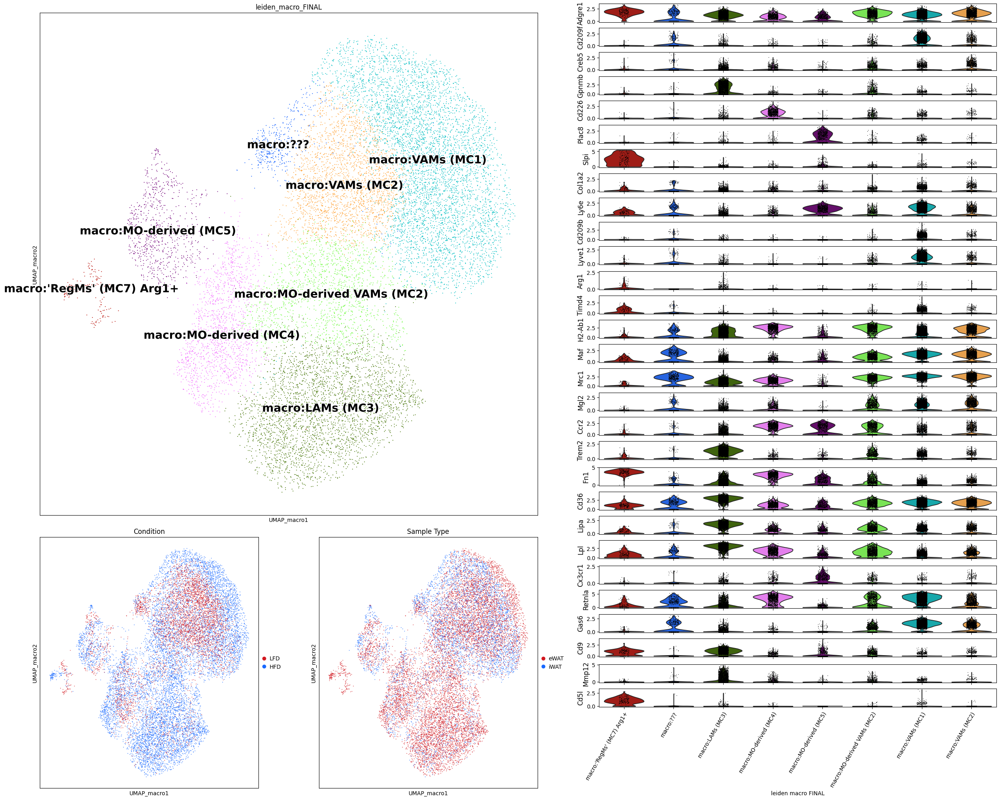

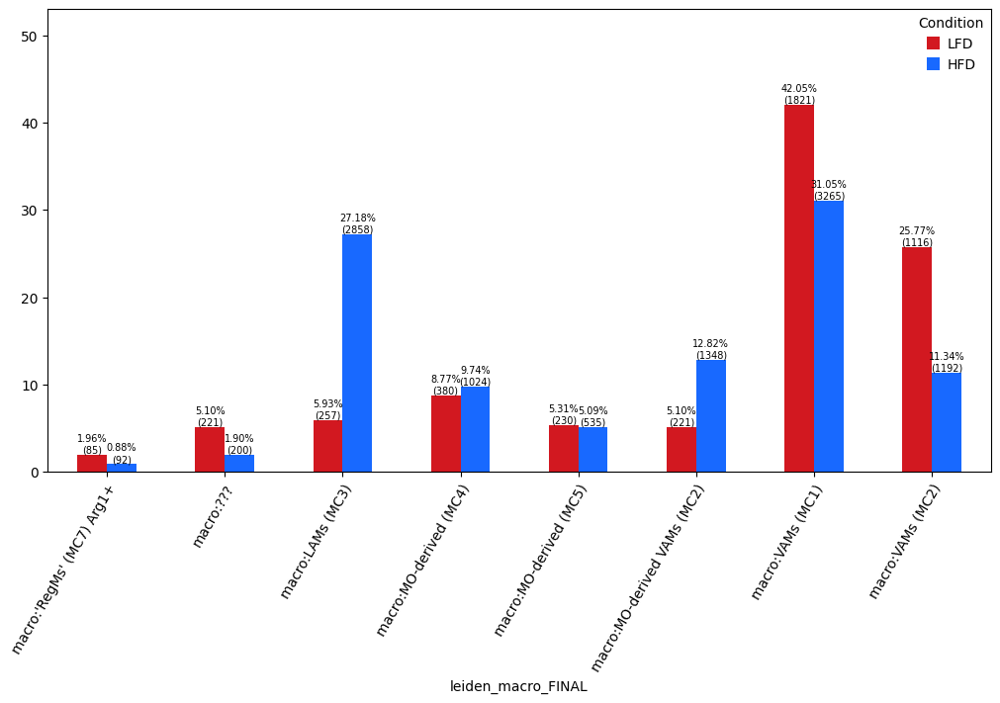

In [71]:
cluster_key = "leiden_macro_FINAL"
old_cluster_key = "leiden_macro_group"
embedding = "UMAP_macro"  # "LocalMAP_macro


adata_macros.obs[cluster_key] = (
    adata_macros.obs[old_cluster_key]
    .map(
        {
            "1": "macro:LAMs (MC3)",
            "2": "macro:VAMs (MC1)",
            "3": "macro:VAMs (MC1)",
            "4": "macro:VAMs (MC2)",
            "5": "macro:MO-derived VAMs (MC2)",
            "6": "macro:MO-derived (MC4)",
            "7": "macro:MO-derived (MC5)",
            "8": "macro:???",
            "9": "macro:'RegMs' (MC7) Arg1+",
        }
    )
    .astype(str)
)

# figure prep
f = plt.figure(figsize=(25, 20), layout="constrained")
sf = f.subfigures(1, 2, width_ratios=[2, 1.5])

axs = sf[0].subplots(3, 2)
gs = axs[0, 0].get_gridspec()
empty_axs(axs)

# Large LocalMAP plot
ax = sf[0].add_subplot(gs[:2, :])
sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=[cluster_key],
    ax=ax,
    show=False,
    legend_loc="on data",
    legend_fontoutline=2,
    legend_fontsize=20,
    palette=color_gen(adata_macros.obs[cluster_key]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 0])

sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=["Condition"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_macros.obs["Condition"]).to_list(),
)
ax = sf[0].add_subplot(gs[2, 1])
sc.pl.embedding(
    adata_macros,
    basis=embedding,
    color=["Sample Type"],
    ax=ax,
    show=False,
    alpha=0.7,
    palette=color_gen(adata_macros.obs["Sample Type"]).to_list(),
)

# Violin marker plots
markers = ["Adgre1", "Cd209f", "Creb5", "Gpnmb", "Cd226", "Plac8", "Slpi", "Col1a2"] + [
    "Ly6e",
    "Cd209b",
    "Lyve1",
    "Arg1",
    "Timd4",
    "H2-Ab1",
    "Maf",
    "Mrc1",  # CD206
    "Mgl2",
    "Ccr2",
    "Trem2",
    "Fn1",
    "Cd36",
    "Lipa",
    "Lpl",
    "Cx3cr1",
    "Retnla",
    "Gas6",
    "Cd9",
    "Mmp12",
    "Cd5l",
]

plot_violinplot(
    adata_macros,
    markers,
    cluster_key,
    sf[1],
    xlabel_params={"angle": 60, "align": "right"},
)

f = plt.figure(figsize=(10, 7), layout="constrained")
plot_cluster_barplots(adata_fibros, "Condition", cluster_key, f)

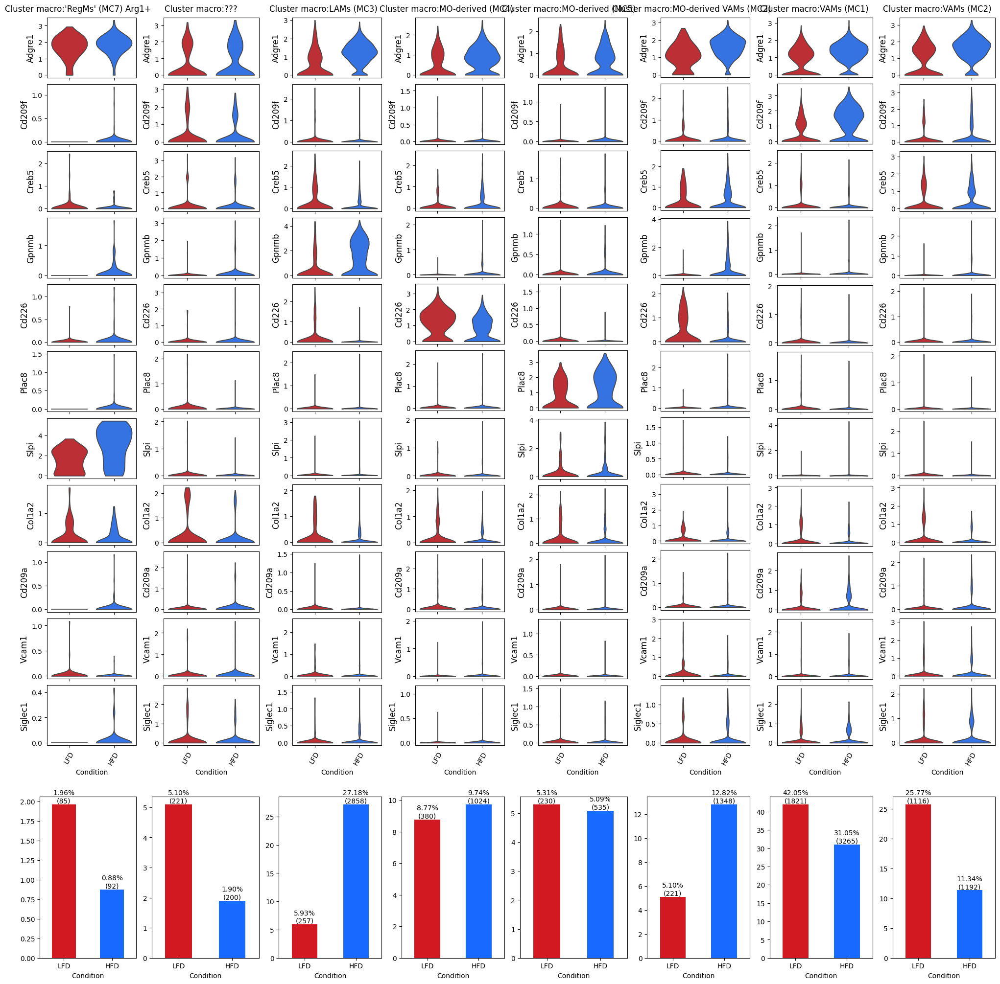

In [13]:
markers = ["Adgre1", "Cd209f", "Creb5", "Gpnmb", "Cd226", "Plac8", "Slpi", "Col1a2"] + [
    # "Ly6e",
    # "Cd209b",
    # "Lyve1",
    # "Arg1",
    # "Timd4",
    # "H2-Ab1",
    # "Maf",
    # "Mrc1",  # CD206
    # "Mgl2",
    # "Ccr2",
    # "Trem2",
    # "Fn1",
    # "Cd36",
    # "Lipa",
    # "Lpl",
    # "Cx3cr1",
    # "Retnla",
    # "Gas6",
    # "Cd9",
    # "Mmp12",
    # "Cd5l",
    "Cd209a",
    "Vcam1",
    # "Xist",
    "Siglec1",
]

f = plt.figure(figsize=(20, 20), layout="constrained")
plot_cluster_violinplot(adata_macros, "Condition", "leiden_macro_FINAL", markers, f)

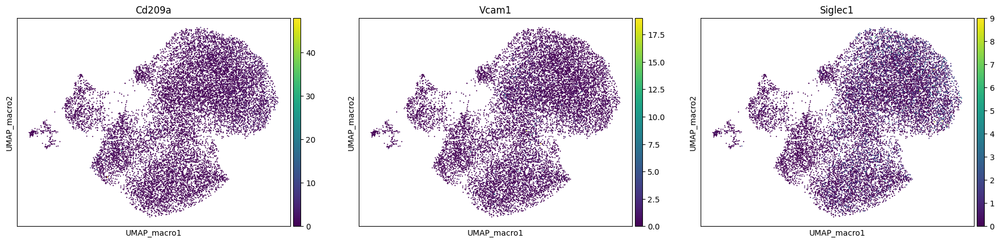

In [16]:
sc.pl.embedding(
    adata_macros,
    "UMAP_macro",
    color=[
        "Cd209a",
        "Vcam1",
        "Siglec1",
    ],
)

dendrogram data not found (using key=dendrogram_leiden_macro_FINAL). Running `sc.tl.dendrogram` with default parameters. For fine tuning it is recommended to run `sc.tl.dendrogram` independently.


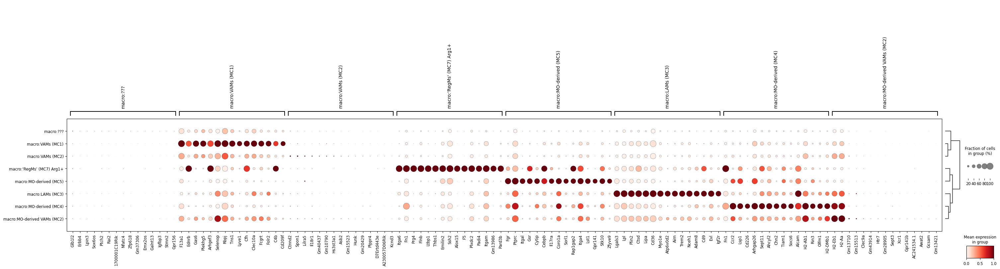

Gene labels are not shown when more than 50 genes are visualized. To show gene labels set `show_gene_labels=True`


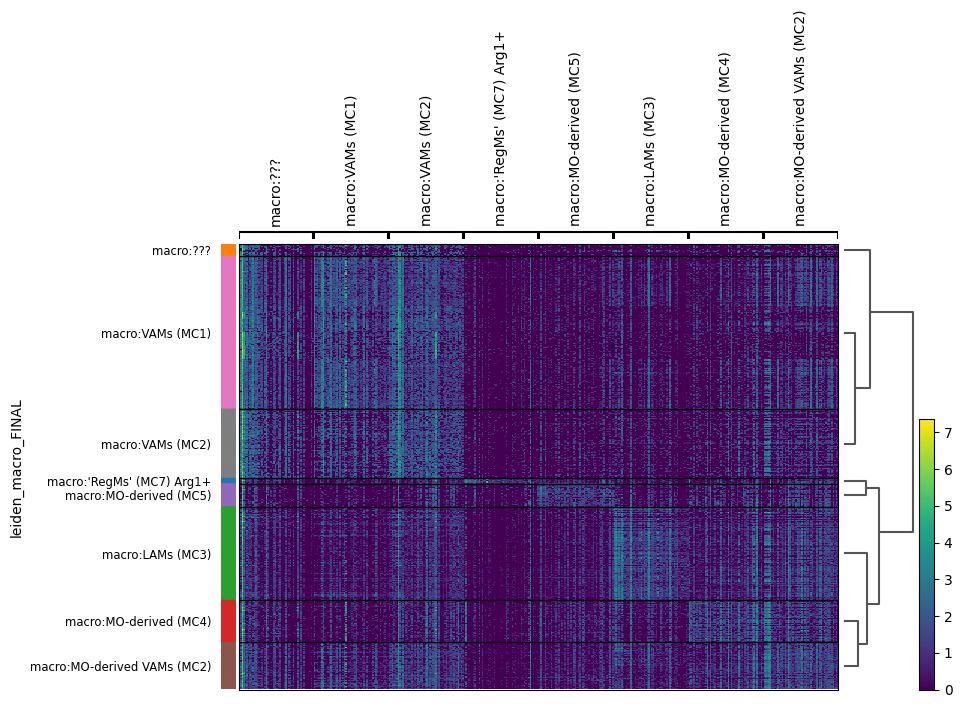

In [19]:
group_key = "leiden_macro_FINAL"
de_key = "de_macro_FINAL"
runDEGs = True

# clean metadata
clear_uns(adata_macros, group_key)

if runDEGs is True:
    # run DEGs
    sc.tl.rank_genes_groups(
        adata_macros,
        groupby=group_key,
        key_added=de_key,
        use_raw=False,
        layer="normalized",
        method="wilcoxon",
    )

# plot DEGs dotplot
f, ax = plt.subplots(1, 1, figsize=(30, 8), layout="constrained")
sc.pl.rank_genes_groups_dotplot(
    adata_macros,
    groupby=group_key,
    key=de_key,
    standard_scale="var",
    n_genes=15,
    min_logfoldchange=2,
    ax=ax,
)

# plot DEGs heatmap
sc.pl.rank_genes_groups_heatmap(
    adata_macros, key=de_key, groupby=group_key, layer="normalized", n_genes=50
)

100%|██████████| 8/8 [15:17<00:00, 114.68s/it]


macro:'RegMs' (MC7) Arg1+
macro:???
macro:LAMs (MC3)
macro:MO-derived (MC4)
macro:MO-derived (MC5)
macro:MO-derived VAMs (MC2)
macro:VAMs (MC1)
macro:VAMs (MC2)


Text(0.5, 1.0, 'GSEA by Cluster vs Others (top 50 each)')

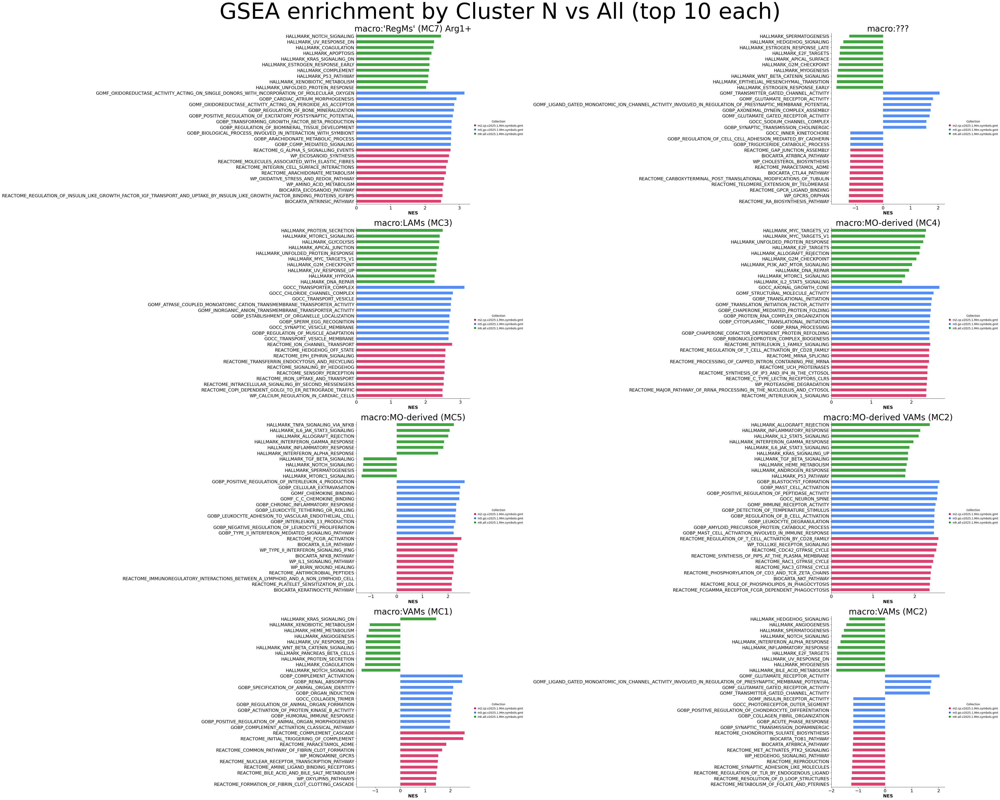

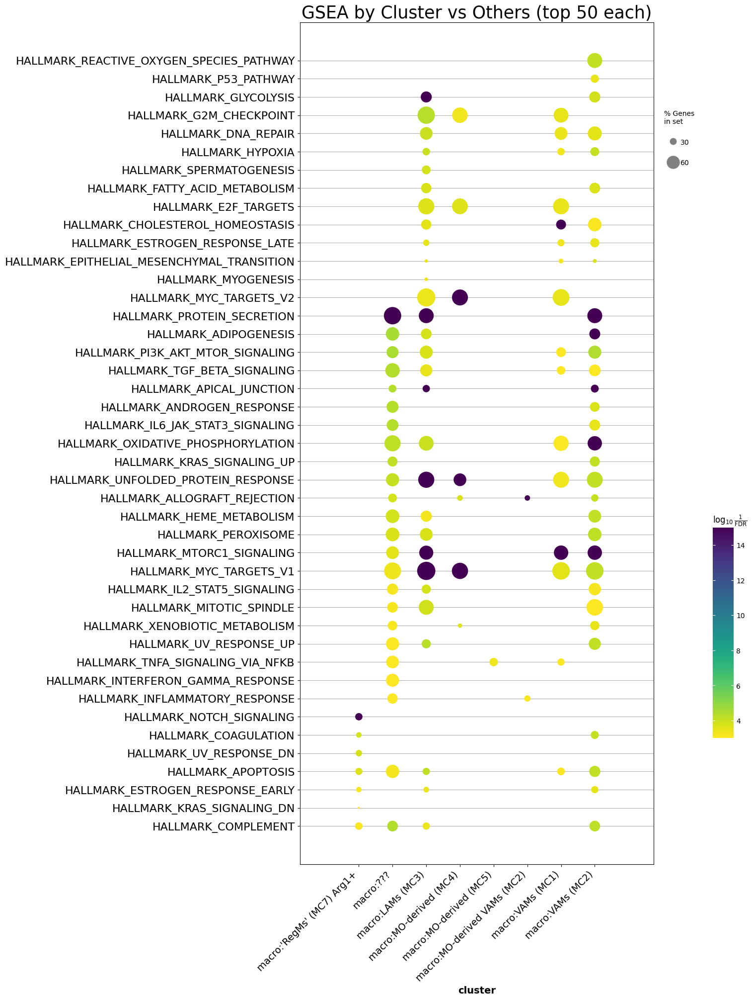

In [22]:
# GSEApy approach, by cluster
runGSEA = False
method = "gsea"
comparison = "leiden_macro_FINAL"
collection_query = "mh"
top_n = 50
ncol = 2
nrow = 4
assert ncol * nrow >= len(adata_macros.obs[comparison].cat.categories)

annotation = "manDoublet-seuratV3-harmony-annotated-macro - GSEA by cluster"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")

# get geneset info
ref_dir = os.path.join(REFDIR, "interactome")
gsea_sets = {
    "MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"),
    "MSigDB-M2-CP": os.path.join(ref_dir, "m2.cp.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M3": os.path.join(ref_dir, "m3.all.v2025.1.Mm.symbols.gmt"),
    "MSigDB-M5-GO": os.path.join(ref_dir, "m5.go.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M7": os.path.join(ref_dir, "m7.all.v2025.1.Mm.symbols.gmt"),
    # "MSigDB-M8": os.path.join(ref_dir, "m8.all.v2025.1.Mm.symbols.gmt"),
}

if runGSEA is True:
    cell_gsea_results = GSEA_gseapy(
        adata_macros,
        genesets=[dataset for dataset in gsea_sets.values()],
        method=method,
        groupby=comparison,
        permutation_num=500,
    )
    with open(os.path.join(savedir, f"{annotation}.pickle"), "wb") as handle:
        pickle.dump(cell_gsea_results, handle)
else:
    with open(os.path.join(savedir, f"{annotation}.pickle"), "rb") as handle:
        cell_gsea_results = pickle.load(handle)


collection_cols = color_gen(pd.Series(gsea_sets))

f, ax = plt.subplots(nrow, ncol, figsize=(25 * ncol, 10 * nrow), layout="constrained")
ax = ax.flatten()
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    print(cluster)
    gp.plot.barplot(
        cell_gsea_results[cluster][cell_gsea_results[cluster]["FDR q-val"] < 0.25],
        "NES",
        group="Collection",
        top_term=10,
        ax=ax[n],
        color=collection_cols,
    )
    ax[n].set_title(cluster, size=30)
f.suptitle(f"GSEA enrichment by Cluster N vs All (top 10 each)", size=80)

df_list = []
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    tmp = cell_gsea_results[cluster].copy()
    tmp["cluster"] = cluster
    df_list.append(tmp[tmp.Collection.str.contains(collection_query)])

results_grouped = pd.concat(df_list, axis=0)
f, ax = plt.subplots(1, 1, figsize=(15, 20), layout="constrained")
gp.plot.dotplot(
    results_grouped,
    "FDR q-val",
    x="cluster",
    ax=ax,
    top_term=top_n,
    cutoff=1e-3,
)
plt.xticks(rotation=45, ha="right")
plt.title(f"GSEA by Cluster vs Others (top {top_n} each)", size=25)

ALL
macro:'RegMs' (MC7) Arg1+
macro:???
macro:LAMs (MC3)
macro:MO-derived (MC4)
macro:MO-derived (MC5)
macro:MO-derived VAMs (MC2)
macro:VAMs (MC1)
macro:VAMs (MC2)


Text(0.5, 1.0, 'HFD GSEA by Cluster (top 50 each)')

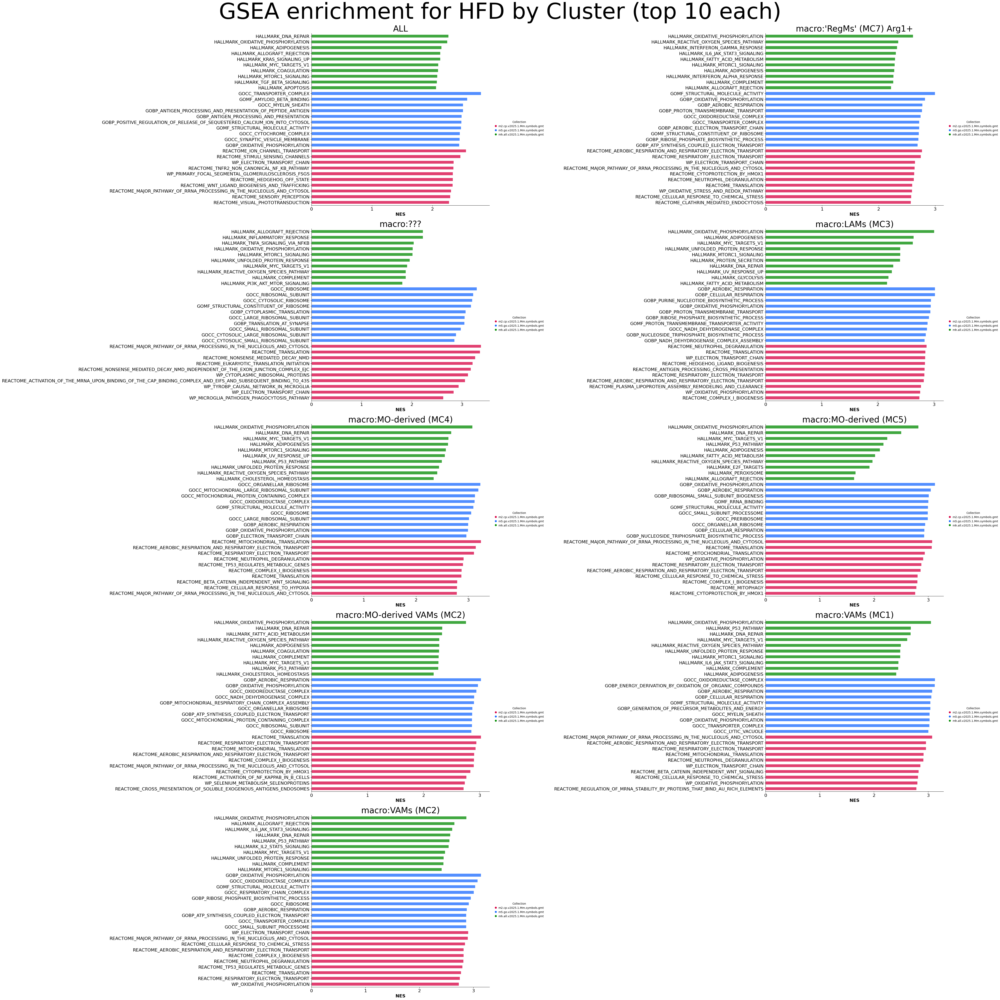

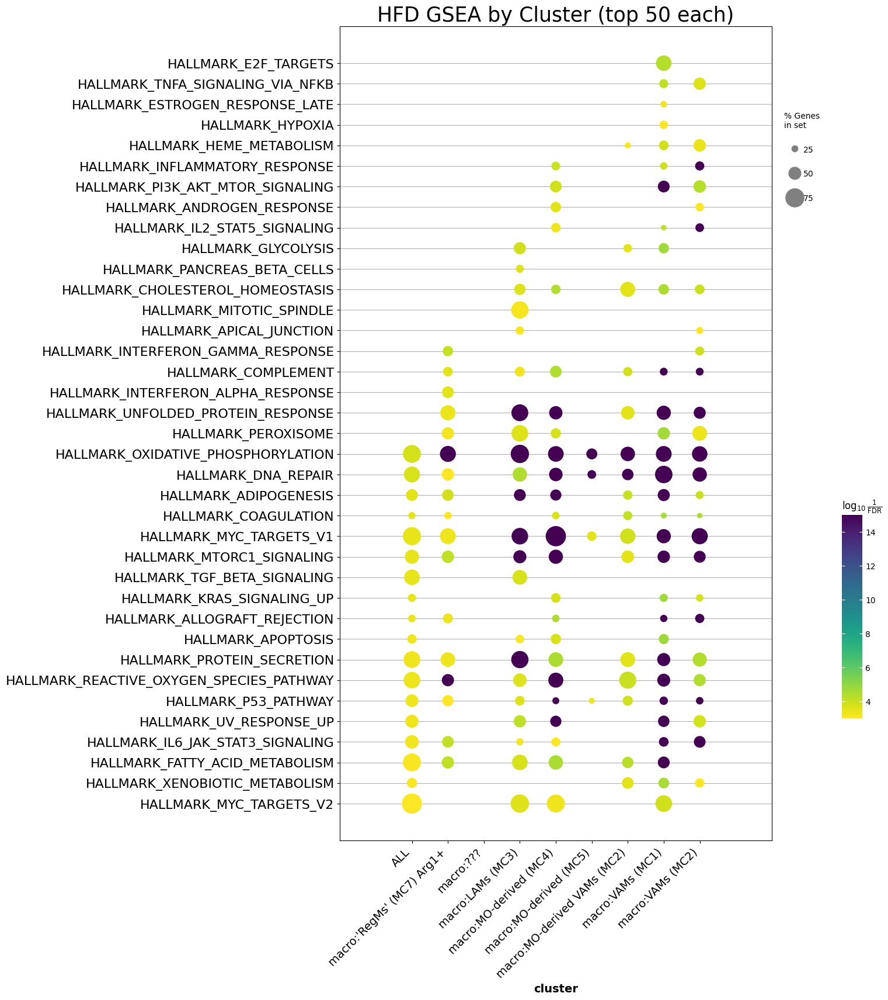

In [25]:
# GSEApy approach, condition by cluster
runGSEA = False
method = "gsea"
cluster_key = "leiden_macro_FINAL"
comparison = "Condition"
collection_query = "mh"
top_n = 50
ncol = 2
nrow = 5
assert ncol * nrow >= len(adata_macros.obs[comparison].cat.categories)

annotation = (
    "manDoublet-seuratV3-harmony-annotated-macro - GSEA for condition by cluster"
)
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")

# get geneset info
ref_dir = os.path.join(REFDIR, "interactome")
gsea_sets = {
    "MACRO_MSigDB-MH": os.path.join(ref_dir, "mh.all.v2025.1.Mm.symbols.gmt"),
    "MACRO_MSigDB-M2-CP": os.path.join(ref_dir, "m2.cp.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M3": os.path.join(ref_dir, "m3.all.v2025.1.Mm.symbols.gmt"),
    "MACRO_MSigDB-M5-GO": os.path.join(ref_dir, "m5.go.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M7": os.path.join(ref_dir, "m7.all.v2025.1.Mm.symbols.gmt"),
    # "MACRO_MSigDB-M8": os.path.join(ref_dir, "m8.all.v2025.1.Mm.symbols.gmt"),
}

if runGSEA is True:
    cell_gsea_results = {}
    for cluster in adata_macros.obs[cluster_key].unique():
        tmp = adata_macros[adata_macros.obs[cluster_key] == cluster]
        cell_gsea_results[cluster] = GSEA_gseapy(
            tmp,
            genesets=[dataset for dataset in gsea_sets.values()],
            method=method,
            groupby=comparison,
            permutation_num=500,
        )

    cell_gsea_results["ALL"] = GSEA_gseapy(
        adata_macros,
        genesets=[dataset for dataset in gsea_sets.values()],
        method=method,
        groupby=comparison,
        permutation_num=500,
    )

    with open(os.path.join(savedir, f"{annotation}.pickle"), "wb") as handle:
        pickle.dump(cell_gsea_results, handle)
else:
    with open(os.path.join(savedir, f"{annotation}.pickle"), "rb") as handle:
        cell_gsea_results = pickle.load(handle)

collection_cols = color_gen(pd.Series(gsea_sets))

f, ax = plt.subplots(nrow, ncol, figsize=(25 * ncol, 10 * nrow), layout="constrained")
ax = ax.flatten()
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    print(cluster)
    tmp = cell_gsea_results[cluster]["HFD"].copy()
    gp.plot.barplot(
        tmp[tmp["FDR q-val"] < 0.25],
        "NES",
        group="Collection",
        top_term=10,
        ax=ax[n],
        color=collection_cols,
    )
    ax[n].set_title(cluster, size=30)
f.suptitle(f"GSEA enrichment for HFD by Cluster (top 10 each)", size=80)
ax[-1].remove()

df_list = []
for n, cluster in enumerate(pd.Series(cell_gsea_results.keys()).sort_values()):
    tmp = cell_gsea_results[cluster]["HFD"].copy()
    tmp["cluster"] = cluster
    df_list.append(tmp[tmp.Collection.str.contains(collection_query)])

results_grouped = pd.concat(df_list, axis=0)
f, ax = plt.subplots(1, 1, figsize=(15, 17), layout="constrained")
gp.plot.dotplot(
    results_grouped,
    "FDR q-val",
    x="cluster",
    ax=ax,
    top_term=top_n,
    cutoff=1e-3,
    x_order=["ALL"]
    + adata_macros.obs[cluster_key].cat.categories.sort_values().to_list(),
)
plt.xticks(rotation=45, ha="right")
plt.title(f"HFD GSEA by Cluster (top {top_n} each)", size=25)

# Save/Load

In [21]:
# save
annotation = "manDoublet-seuratV3-harmony-annotated-macro"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")
os.makedirs(savedir, exist_ok=True)
adata_macros.write(os.path.join(savedir, f"{annotation}.h5ad"))

In [4]:
# load
annotation = "manDoublet-seuratV3-harmony-annotated-macro"
savedir = os.path.join(DATADIR, "processed", "single cell", "4_subclustered")
adata_macros = sc.read_h5ad(os.path.join(savedir, f"{annotation}.h5ad"))

# # relevant subsets
# ewat_macros = adata_macros[adata_macros.obs["Sample Type"] == "eWAT"].copy()
# lfd_ewat_macros = ewat_macros[ewat_macros.obs["Condition"] == "LFD"].copy()
# hfd_ewat_macros = ewat_macros[ewat_macros.obs["Condition"] == "HFD"].copy()

# Exploration Zone

### Gene Deep Dive (Arg1+)

In [ ]:
sc.pl.violin(
    adata_macros, ["Arg1"], groupby="leiden_macro", use_raw=False, layer="normalized"
)
sc.pl.embedding(adata_macros, basis=embedding, color=["Arg1"], cmap="BuPu")

In [ ]:
adata_macros.obs["Arg1+"] = (
    adata_macros[:, "Arg1"].layers["normalized"].toarray().flatten() > 0
)
print(adata_macros.obs["Arg1+"].sum())
adata_macros.obs["Arg1+"] = adata_macros.obs["Arg1+"].map({True: "High", False: "Low"})
sc.pl.embedding(
    adata_macros, basis=embedding, color=["Arg1+", "leiden_macro"], cmap="BuPu"
)

In [ ]:
sc.tl.rank_genes_groups(
    adata_macros,
    groupby="Arg1+",
    key_added="de_Arg1+_macro",
    use_raw=False,
    layer="normalized",
    method="wilcoxon",
)
df = sc.get.rank_genes_groups_df(
    adata_macros, group="High", key="de_Arg1+_macro", pval_cutoff=0.001
)

In [ ]:
f, ax = plt.subplots(1, 1, figsize=(8, 3), layout="constrained")
sc.pl.violin(
    adata_macros, ["Arg1"], groupby="Groups", use_raw=False, layer="normalized", ax=ax
)

In [ ]:
other_degs = adata_macros[:, df.head(30)["names"].to_list()].layers["normalized"]
arg1 = adata_macros[:, ["Arg1"]].layers["normalized"]

In [ ]:
def scatter_gene_comparison(
    adata, main_gene, genes_list, group_col, layer=None, ncols=5
):
    """Quick gene expression scatter plots colored by group."""
    # Setup
    main_expr = (
        adata[:, main_gene].layers[layer].toarray().flatten()
        if layer
        else adata[:, main_gene].X.toarray().flatten()
    )
    nrows = int(np.ceil(len(genes_list) / ncols))

    # Create plot
    fig, axes = plt.subplots(
        nrows, ncols, figsize=(4 * ncols, 4 * nrows), layout="constrained"
    )
    axes = axes.flatten()

    # Plot each comparison
    for i, gene in enumerate(genes_list):
        gene_expr = (
            adata[:, gene].layers[layer].toarray().flatten()
            if layer
            else adata[:, gene].X.toarray().flatten()
        )
        for group in adata.obs[group_col].unique():
            mask = adata.obs[group_col] == group
            axes[i].scatter(
                gene_expr[mask], main_expr[mask], s=1, alpha=0.5, label=group
            )

        axes[i].set_xlabel(gene)
        axes[i].set_ylabel(main_gene if i % ncols == 0 else "")
        axes[i].spines[["top", "right"]].set_visible(False)
        axes[i].set_title(f"{main_gene} vs {gene}")
        if i == 0:
            axes[i].legend(frameon=True)

    # Clean up
    for ax in axes[len(genes_list) :]:
        ax.remove()
    return fig


fig = scatter_gene_comparison(
    adata,
    main_gene="Arg1",
    genes_list=df.head(30)["names"].to_list(),
    group_col="Condition",
    layer="normalized",
)

In [ ]:
name = "MSigDB-M3 Arg1+ only"
ref_dir = os.path.join(REFDIR, "interactome")
GSEA_decoupler(
    adata_macros,
    name,
    geneset_dir=os.path.join(ref_dir, "m3.all.v2025.1.Mm.symbols.gmt"),
)
plot_gsea_dc(
    adata_macros,
    f"GSEA ({name})",
    f"{name}_score_ulm",
    "Arg1+",
    n_markers=10,
    flip=True,
)